<a href="https://colab.research.google.com/github/MoncefDj/AI-DS-Masters/blob/main/Machine_Learning_Applications_Workshop_Time_Series_Forecasting_on_ETTh1_Multivariate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1
  style="
    border: 2px solid aqua;
    border-radius: 8px;
    padding: 8px;
    text-align: center;
  "
>
  Machine Learning Applications Workshop: Time Series Forecasting on ETTh1 Multivariate
</h1>

**By:**
- Djezza Moncef
- Sadoudi Abdessamad
  
**Under the supervision of:**
- Dr. Bachir Said

## About the ETT-small Dataset


#### ETT-small Dataset Overview
The ETT-small dataset provides two years of data recorded at both minute-level and hourly-level frequencies from two regions in a Chinese province:
- **Minute-level datasets**: ETT-small-m1 and ETT-small-m2, each containing 70,080 data points (2 years * 365 days * 24 hours * 4 times).
- **Hourly-level datasets**: ETT-small-h1 and ETT-small-h2, designed for faster experimentation and development.

#### Features
Each data point includes 8 features:
1. **date**: The timestamp of the observation.
2. **HUFL**: High Useful Load.
3. **HULL**: High Useless Load.
4. **MUFL**: Middle Useful Load.
5. **MULL**: Middle Useless Load.
6. **LUFL**: Low Useful Load.
7. **LULL**: Low Useless Load.
8. **OT**: Oil Temperature (target variable for prediction).


## Why Oil Temperature is involved in this dataset?

The electric power distribution problem is the distribution of electricity to different areas depends on its sequential usage. But predicting the following demand of a specific area is difficult, as it varies with weekdays, holidays, seasons, weather, temperatures, etc. However, no existing method can perform a long-term prediction based on super long-term real-world data with high precision. Any false prophecy may damage the electrical transformer. So currently, without an efficient method to predict future electric usage, managers have to make decisions based on the empirical number, which is much higher than the real-world demands. It causes unnecessary waste of electric and equipment depreciation. On the other hand, the oil temperatures can reflect the conditon of electricity Transformer. One of the most efficient strategies is to predict how the electrical transformers' oil temperature is safe and avoid unnecessary waste. As a result, to address this problem, We are going to work on it to predict the electrical transformers' oil temperature and investigate the extreme load capacity.

## Data Loading

In [ ]:
!git clone https://github.com/zhouhaoyi/ETDataset.git
!ls

Cloning into 'ETDataset'...
remote: Enumerating objects: 187, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 187 (delta 25), reused 20 (delta 20), pack-reused 159 (from 1)
Receiving objects: 100% (187/187), 3.86 MiB | 14.84 MiB/s, done.
Resolving deltas: 100% (62/62), done.
ETDataset  sample_data


In [ ]:
import pandas as pd

ETTH1 = pd.read_csv('ETDataset/ETT-small/ETTh1.csv')
ETTH1

,date,HUFL,HULL,MUFL,MULL,LUFL,LULL,OT
0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000
1,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001
2,2016-07-01 02:00:00,5.157,1.741,1.279,0.355,3.777,1.218,27.787001
3,2016-07-01 03:00:00,5.090,1.942,1.279,0.391,3.807,1.279,25.044001
4,2016-07-01 04:00:00,5.358,1.942,1.492,0.462,3.868,1.279,21.948000
...,...,...,...,...,...,...,...,...
17415,2018-06-26 15:00:00,-1.674,3.550,-5.615,2.132,3.472,1.523,10.904000
17416,2018-06-26 16:00:00,-5.492,4.287,-9.132,2.274,3.533,1.675,11.044000
17417,2018-06-26 17:00:00,2.813,3.818,-0.817,2.097,3.716,1.523,10.271000
17418,2018-06-26 18:00:00,9.243,3.818,5.472,2.097,3.655,1.432,9.778000


In [ ]:
ETTH1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17420 entries, 0 to 17419
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    17420 non-null  object 
 1   HUFL    17420 non-null  float64
 2   HULL    17420 non-null  float64
 3   MUFL    17420 non-null  float64
 4   MULL    17420 non-null  float64
 5   LUFL    17420 non-null  float64
 6   LULL    17420 non-null  float64
 7   OT      17420 non-null  float64
dtypes: float64(7), object(1)
memory usage: 1.1+ MB


In [ ]:
# Extracting Year, Month, Day, etc., from the date for further analysis
ETTH1['date'] = pd.to_datetime(ETTH1['date'])
ETTH1['year'] = ETTH1['date'].dt.year
ETTH1['month'] = ETTH1['date'].dt.month
ETTH1['day'] = ETTH1['date'].dt.day

### Time Plot for All Features

In [ ]:
import plotly.express as px

# Melting the dataset for easier plotting
ETTH1_melted = ETTH1.melt(id_vars='date', var_name='Feature', value_name='Value')

# Time plot using Plotly
fig = px.line(
    ETTH1_melted,
    x='date',
    y='Value',
    color='Feature',
    title='Time Plot for All Features',
    labels={'date': 'Date', 'Value': 'Value', 'Feature': 'Feature'}
)
fig.update_layout(width=900, height=600)
fig.show()


- HUFL and MUFL are similar.
- HULL and MULL also exhibit similarities, though not as identical as HUFL and MUFL.  


### Box Plots for All Features (Monthly Distribution)

In [ ]:
# Melting the dataset for box plots
ETTH1_melted = ETTH1.melt(id_vars=['date', 'month'], var_name='Feature', value_name='Value')

# Box plot for monthly distribution
fig = px.box(
    ETTH1_melted,
    x='month',
    y='Value',
    color='Feature',
    title='Monthly Distribution for All Features',
    labels={'month': 'Month', 'Value': 'Value', 'Feature': 'Feature'}
)
fig.update_layout(width=900, height=600)
fig.show()

- The distributions of HUFL and MUFL, including outliers, are nearly the same.   
- The distributions of HULL and MULL show minor differences.

### Heatmap of Correlations

In [ ]:
import plotly.figure_factory as ff

features = ETTH1.columns[1:]  # Exclude the 'date' column

# Compute correlation matrix
correlation_matrix = ETTH1[features[:-3]].corr().round(2)

# Create a heatmap
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=list(correlation_matrix.columns),
    y=list(correlation_matrix.index),
    annotation_text=correlation_matrix.values,
    colorscale='Viridis',
    showscale=True
)
fig.update_layout(title_text="Correlation Matrix", width=700, height=700)
fig.show()

- HUFL and MUFL have a 99% correlation, meaning their values are almost identical.  
- HULL and MULL have a 93% correlation, which is still high.  

### Time Series Decomposition (Interactive Subplots)

In [ ]:
!pip install statsmodels

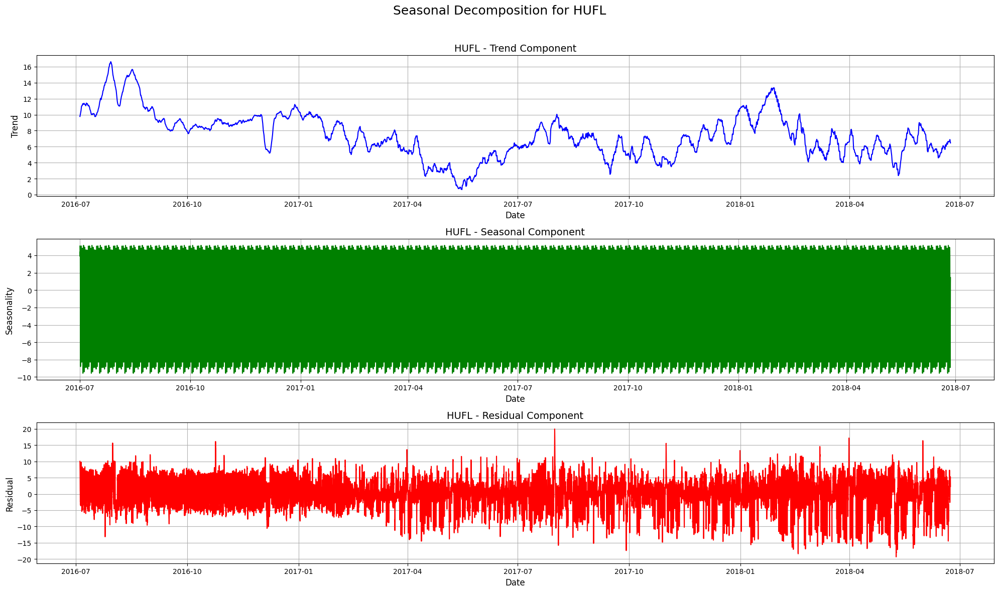

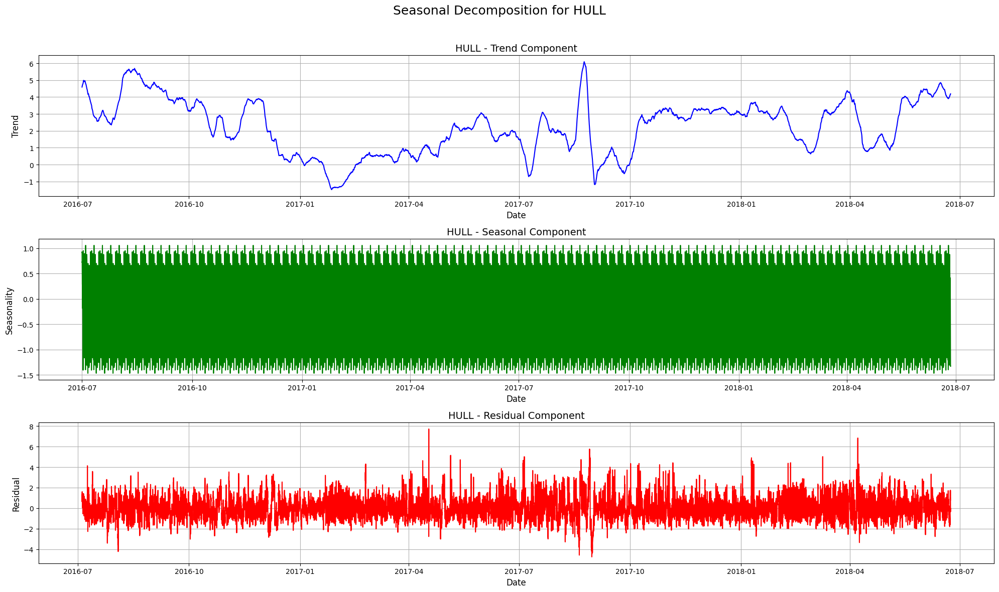

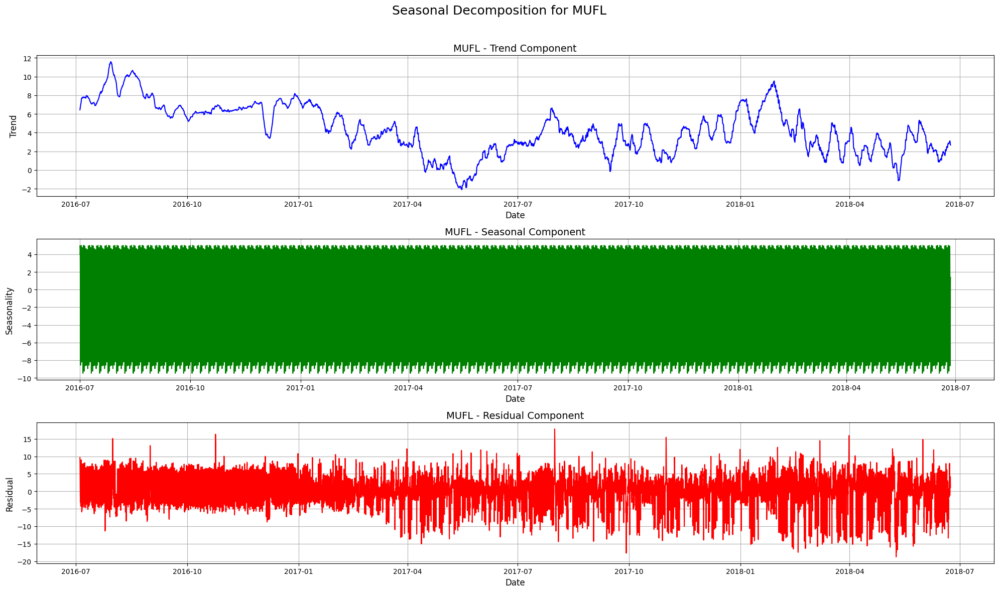

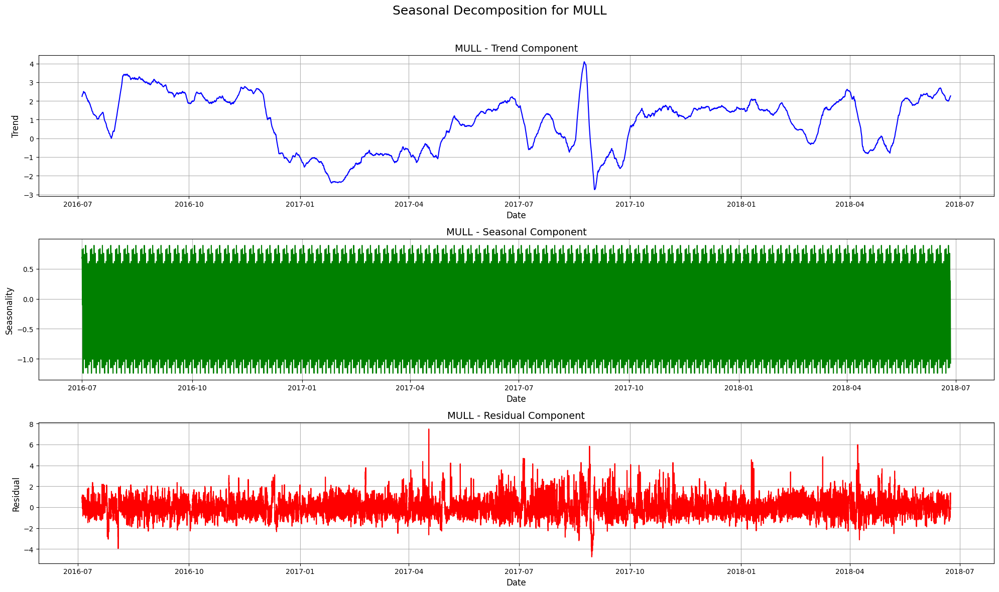

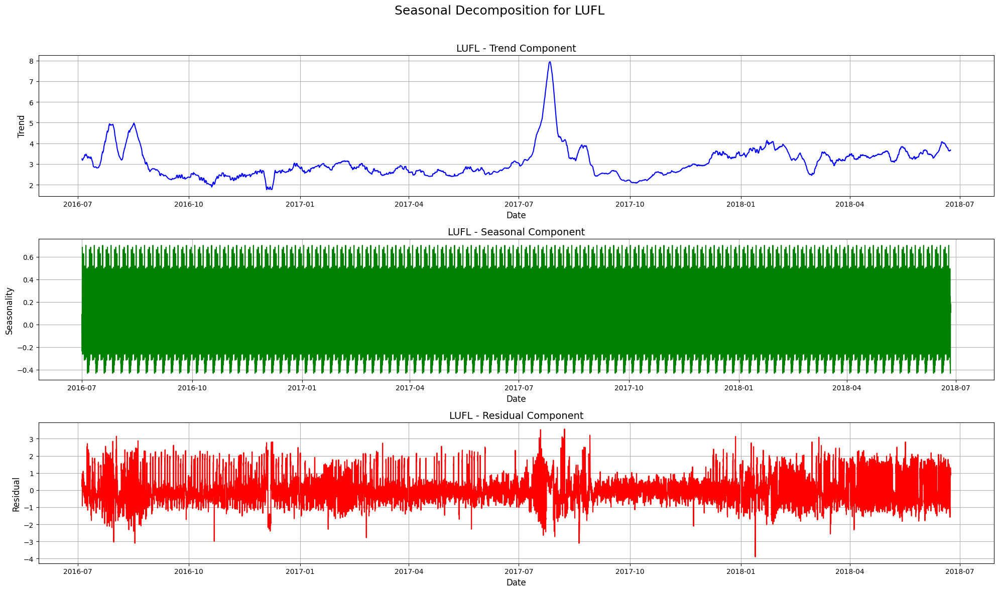

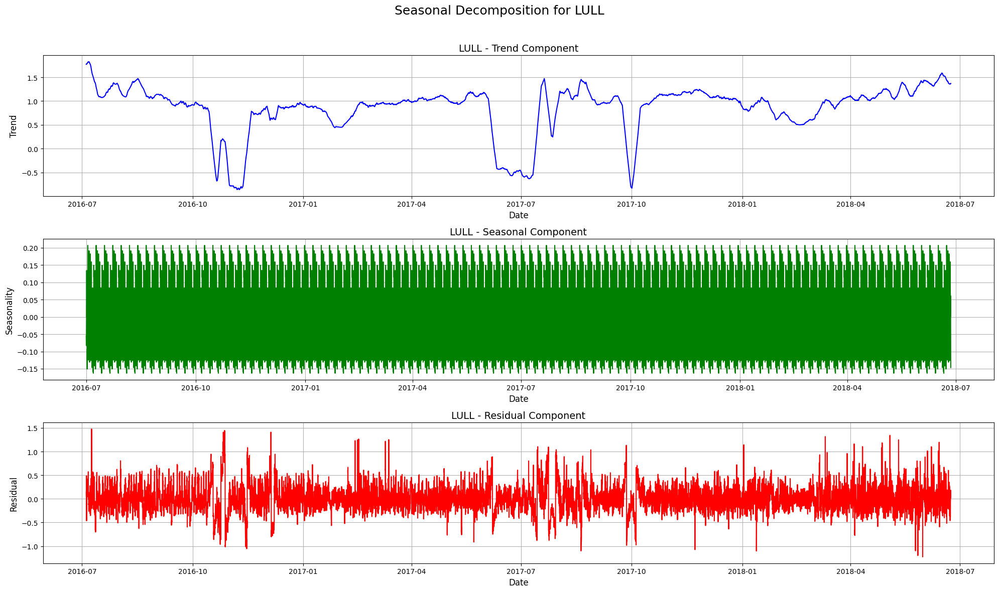

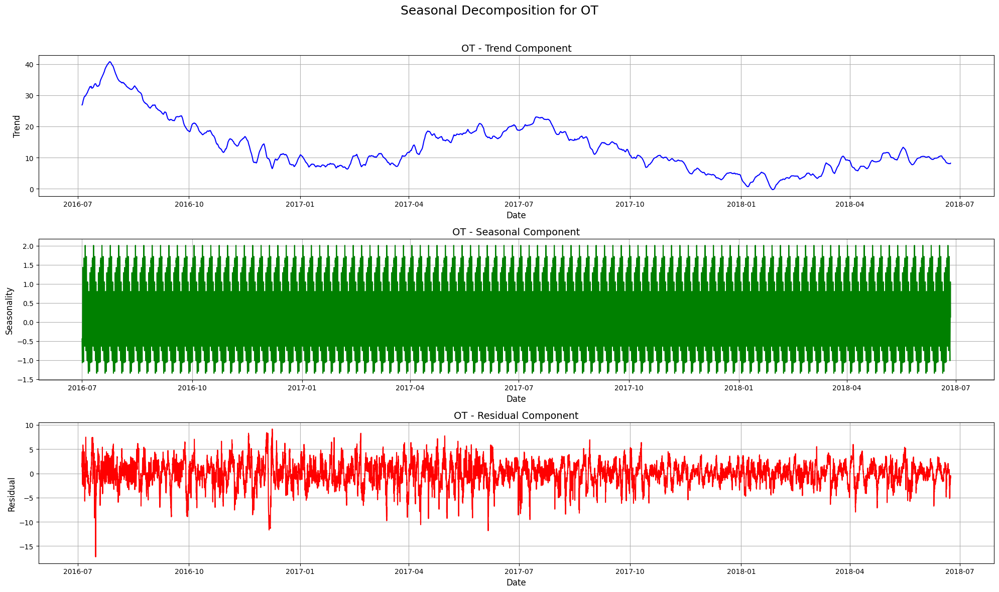

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Decomposition plots for all features with increased width
for feature in features[:-3]:
    decomposition = seasonal_decompose(
        ETTH1.set_index('date')[feature], model='additive', period=24 * 7
    )

    # Creating subplots for trend, seasonal, and residual components
    plt.figure(figsize=(20, 12))  # Increased figure size for better visibility
    plt.suptitle(f'Seasonal Decomposition for {feature}', fontsize=18)

    # Trend
    plt.subplot(3, 1, 1)
    plt.plot(decomposition.trend, label='Trend', color='blue')
    plt.title(f'{feature} - Trend Component', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Trend', fontsize=12)
    plt.grid()

    # Seasonal
    plt.subplot(3, 1, 2)
    plt.plot(decomposition.seasonal, label='Seasonal', color='green')
    plt.title(f'{feature} - Seasonal Component', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Seasonality', fontsize=12)
    plt.grid()

    # Residual
    plt.subplot(3, 1, 3)
    plt.plot(decomposition.resid, label='Residual', color='red')
    plt.title(f'{feature} - Residual Component', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Residual', fontsize=12)
    plt.grid()

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout for the title
    plt.show()

### Lag Analysis (Autocorrelation and PACF)

Autocorrelation and Partial Autocorrelation for HUFL


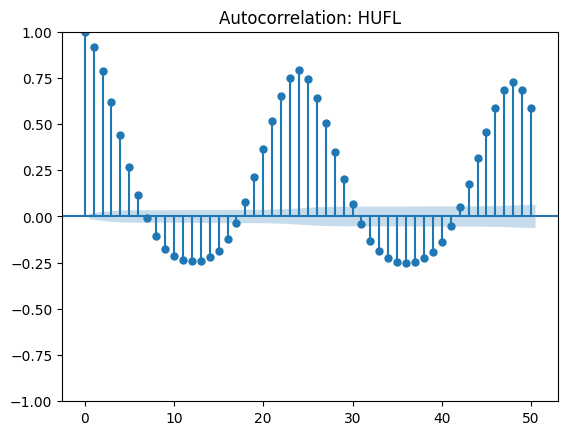

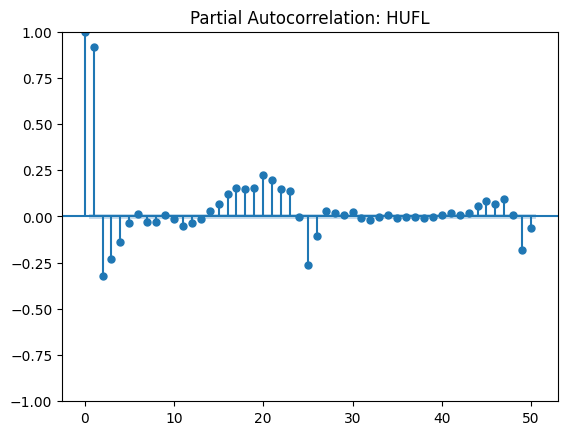

Autocorrelation and Partial Autocorrelation for HULL


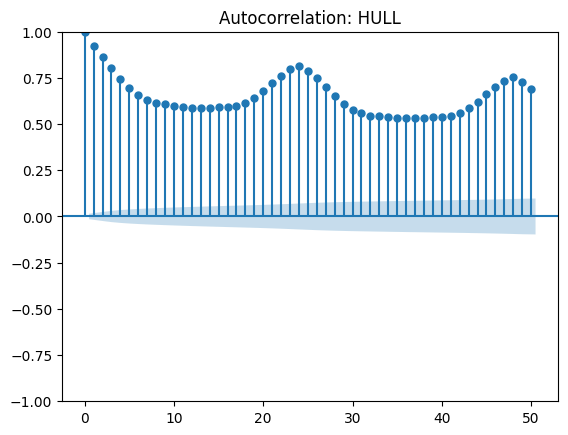

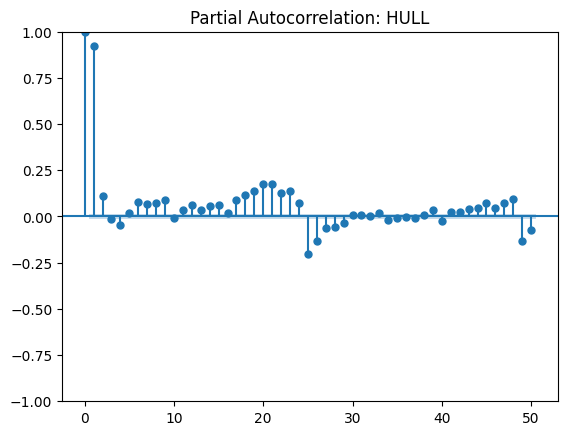

Autocorrelation and Partial Autocorrelation for MUFL


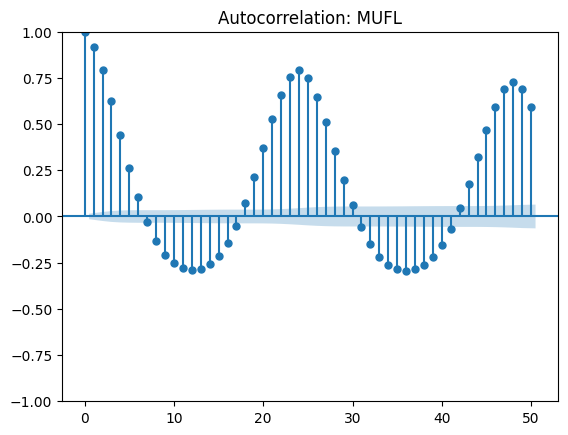

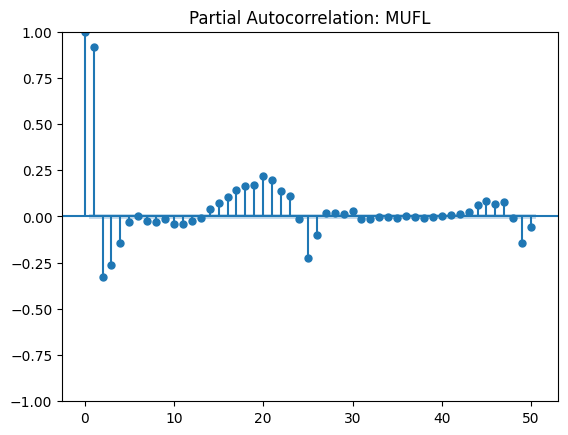

Autocorrelation and Partial Autocorrelation for MULL


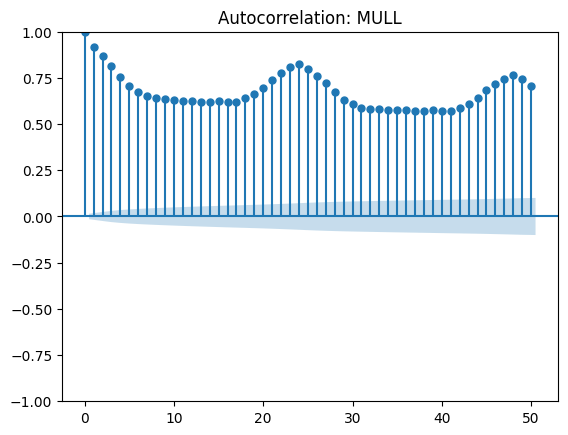

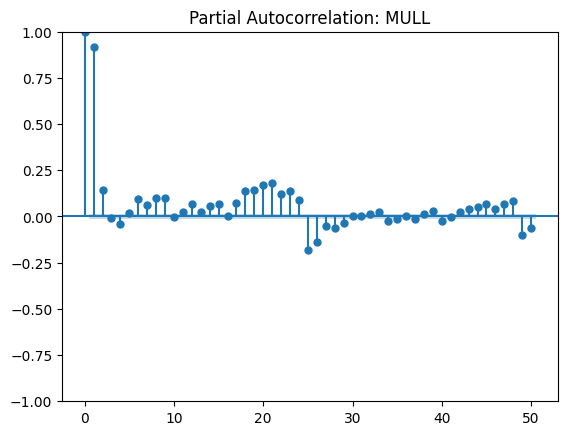

Autocorrelation and Partial Autocorrelation for LUFL


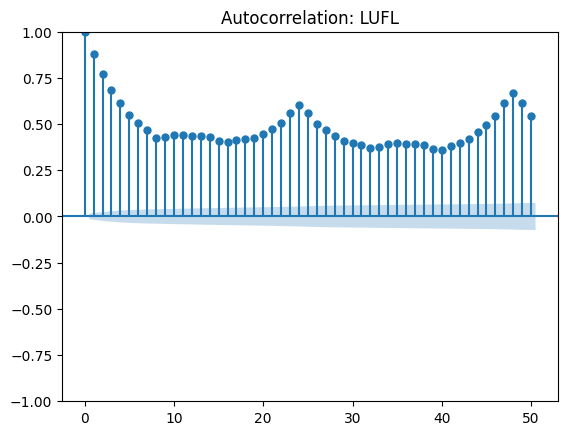

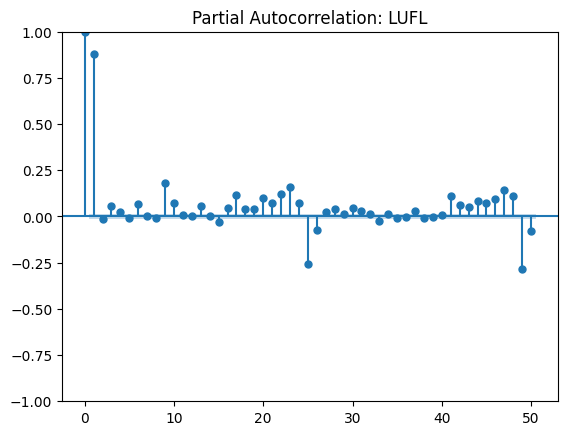

Autocorrelation and Partial Autocorrelation for LULL


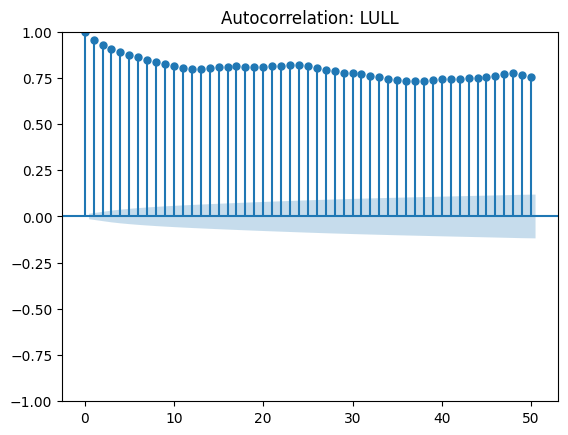

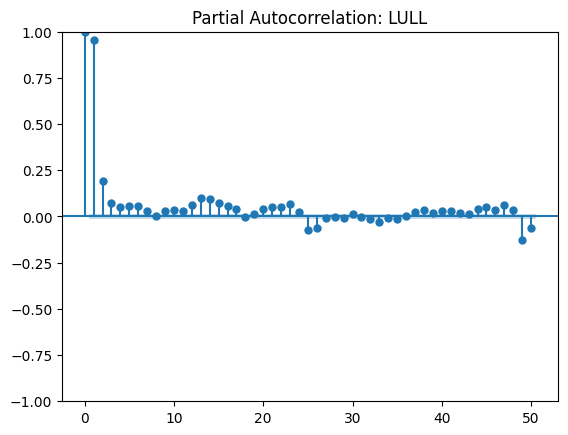

Autocorrelation and Partial Autocorrelation for OT


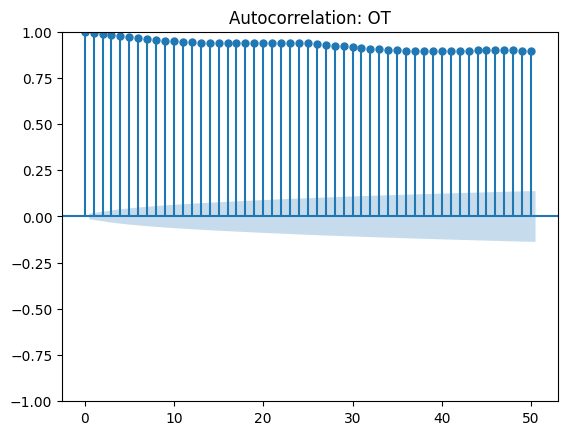

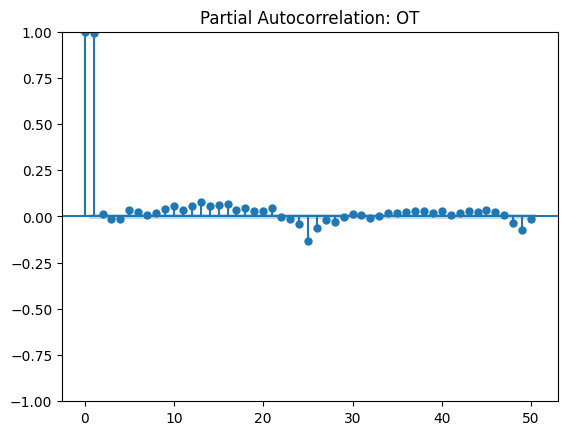

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# ACF and PACF for each feature
for feature in features[:-3]:
    print(f"Autocorrelation and Partial Autocorrelation for {feature}")
    fig_acf = plot_acf(ETTH1[feature].dropna(), lags=50, title=f"Autocorrelation: {feature}")
    plt.show()

    fig_pacf = plot_pacf(ETTH1[feature].dropna(), lags=50, title=f"Partial Autocorrelation: {feature}")
    plt.show()

## Model Selection and Implementation

### General Setup for Data

- **Data Cleaning & Preprocessing**:  
  - Removing highly correlated features reduces redundancy.  
  - Removing outliers ensures stable model training.  
  - Applying z-score normalization makes features comparable.  
- **Train-Test Split**:  
  - Splitting data ensures that model evaluation is done on unseen data, preventing overfitting and providing a realistic measure of performance.  

In [ ]:
# Importing required libraries
import numpy as np
import pandas as pd
from scipy.stats import zscore
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Define evaluation metrics
def evaluate(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    return {"MAE": mae, "MSE": mse, "RMSE": rmse}

# Load dataset
# data = pd.read_csv('ETDataset/ETT-small/ETTh1.csv')
data = ETTH1
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)
target = 'OT'

# Remove one feature from highly correlated pairs
# Keeping 'HUFL' and 'HULL', dropping 'MUFL' and 'MULL'
data = data.drop(['MUFL', 'MULL'], axis=1)

# Remove outliers using Z-score method
# Calculate Z-scores and filter data
z_scores = data.apply(zscore)
threshold = 3
data = data[(np.abs(z_scores) < threshold).all(axis=1)]

# Z-score normalization for features only (excluding target)
features = data.columns.difference([target])
data[features] = data[features].apply(zscore)

# Train-test split
train_size = int(len(data) * 0.8)
train_data = data.iloc[:train_size]
test_data = data.iloc[train_size:]

# Check the resulting data
print(f"Train data shape: {train_data.shape}")
print(f"Test data shape: {test_data.shape}")

Train data shape: (13124, 8)
Test data shape: (3281, 8)


### Feature Engineering (Lags, Rolling Means, Seasonal Features)

  - Lags provide direct past values as predictors.  
  - Rolling Means smooth the series and capture local averages.  
  - Hour and day_of_week features allow models to leverage daily and weekly patterns.  


In [ ]:
# Lag Features
train_data['lag_1'] = train_data[target].shift(1)
train_data['lag_2'] = train_data[target].shift(2)
train_data['rolling_mean'] = train_data[target].rolling(window=3).mean()

# Seasonal Features
train_data['hour'] = train_data.index.hour
train_data['day_of_week'] = train_data.index.dayofweek

# Drop rows with NaN values (due to lag/rolling mean creation)
train_data = train_data.dropna()

# Prepare features and target
X_train = train_data.drop(columns=[target])
y_train = train_data[target]

# Apply the same feature engineering to the test data
test_data['lag_1'] = test_data[target].shift(1)
test_data['lag_2'] = test_data[target].shift(2)
test_data['rolling_mean'] = test_data[target].rolling(window=3).mean()
test_data['hour'] = test_data.index.hour
test_data['day_of_week'] = test_data.index.dayofweek

# Drop rows with NaN values (due to lag/rolling mean creation)
test_data = test_data.dropna()

# Prepare features and target for testing
X_test = test_data.drop(columns=[target])

- **Grid Searches/Loops**:  
  - Iterating over various hyperparameters (lags, orders, trends) tries multiple configurations, ensuring a better model choice.

### Autoregressive (AR)

- **Definition**: An AR model predicts a target variable based on its own past values. Specifically, the AR(p) model expresses the current value as a linear combination of the previous p values plus some noise.  
- **Why Using It**: It is a simple baseline model, useful when the past behavior of the series is strongly predictive of its future.  
- **Concept**: AR models rely purely on the target’s historical patterns, assuming that past values contain sufficient predictive information.  
- **Strengths**: Easy to implement and interpret, suitable for series where the main predictor is the series itself.  
- **Weaknesses**: Does not directly account for external variables; can fail when the relationship changes over time or when other features are important.  
- **Intuition Behind Code**:  
  - `AutoReg(train_data[target], lags=lags).fit()`: Fits an AR model using a specified number of past observations as predictors.  
  - The loop searching over `lags` tries different lag lengths to find the best predictive performance.  

In [ ]:
from statsmodels.tsa.ar_model import AutoReg

# Find best lags
best_mse = float('inf')
best_lags = None

for lags in range(1, 50, 5):
    ar_model = AutoReg(y_train, lags=lags).fit()
    ar_forecast = ar_model.predict(start=len(y_train), end=len(y_train) + len(test_data) - 1)
    mse = mean_squared_error(test_data[target], ar_forecast)
    if mse < best_mse:
        best_mse, best_lags = mse, lags

# Best AR Model
ar_model = AutoReg(y_train, lags=best_lags).fit()
ar_forecast = ar_model.predict(start=len(y_train), end=len(y_train) + len(test_data) - 1)

# Evaluate AR Model
ar_metrics = evaluate(test_data[target], ar_forecast)
print(f"Best AR Lags: {best_lags}, Metrics: {ar_metrics}")

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:308: UserWarning:

Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.

/usr/local/lib/python3.10/dist-packages/statsmodel

Best AR Lags: 46, Metrics: {'MAE': 3.347523977691913, 'MSE': 16.317593396273146, 'RMSE': 4.039504102767213}


### ARIMA

- **Definition**: ARIMA (AutoRegressive Integrated Moving Average) combines autoregressive terms, differencing (to ensure stationarity), and moving averages (to model error terms) to forecast future values.  
- **Why Using It**: ARIMA is a classical, well-established method that can handle a variety of non-stationary patterns through differencing.  
- **Concept**: ARIMA decomposes a series into a stationary part plus error terms, applying differencing to remove trends and then fitting AR and MA components.  
- **Strengths**: Widely understood, can model a variety of time series patterns if well-tuned.  
- **Weaknesses**: Parameter tuning can be time-consuming; less effective with complex seasonality or multiple external features.  
- **Intuition Behind Code**:  
  - `ARIMA(train_data[target], order=(p, d, q)).fit()`: Fits an ARIMA model with chosen p, d, q parameters.  
  - The parameter grid search tries multiple configurations to find the one that minimizes forecast error.



In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Grid search for ARIMA parameters
best_mse = float('inf')
best_order = None

for p in range(1, 3):
    for d in range(1, 3):
        for q in range(1, 3):
            try:
                arima_model = ARIMA(train_data[target], order=(p, d, q)).fit()
                arima_forecast = arima_model.forecast(steps=len(test_data))
                mse = mean_squared_error(test_data[target], arima_forecast)
                if mse < best_mse:
                    best_mse, best_order = mse, (p, d, q)
            except:
                continue

# Best ARIMA model
arima_model = ARIMA(train_data[target], order=best_order).fit()
arima_forecast = arima_model.forecast(steps=len(test_data))
arima_metrics = evaluate(test_data[target], arima_forecast)
print(f"Best ARIMA Order: {best_order}, Metrics: {arima_metrics}")

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the 

Best ARIMA Order: (1, 1, 2), Metrics: {'MAE': 6.488539073480042, 'MSE': 53.392223811452844, 'RMSE': 7.306998276409598}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



### Exponential Smoothing

- **Definition**: Exponential smoothing models, including Holt-Winters, forecast by weighting past observations with exponentially decaying factors. Holt-Winters adds trend and seasonality adjustments.  
- **Why Using It**: Useful when there’s a known seasonal period and trend, providing a quick and effective way to model patterns without extensive parameter tuning.  
- **Concept**: More recent observations get higher weight, but the model still considers older data. Seasonal versions handle repeating patterns over fixed intervals.  
- **Strengths**: Simple, handles trends and seasonality, quick to implement.  
- **Weaknesses**: Not suited for complex patterns beyond trend/seasonality; can be outperformed by more sophisticated methods.  
- **Intuition Behind Code**:  
  - `ExponentialSmoothing(train_data[target], trend=trend, seasonal=seasonal, seasonal_periods=24).fit()`: Fits a model that accounts for level, trend, and seasonality.  
  - The loops over `trend` and `seasonal` test different configurations (additive or multiplicative) to find a good fit.



In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Tune Exponential Smoothing (trend, seasonal)
best_mse = float('inf')
best_config = None

for trend in ['add', 'mul']:
    for seasonal in ['add', 'mul']:
        try:
            es_model = ExponentialSmoothing(train_data[target],
                                            trend=trend,
                                            seasonal=seasonal,
                                            seasonal_periods=24).fit()
            es_forecast = es_model.forecast(steps=len(test_data))
            mse = mean_squared_error(test_data[target], es_forecast)
            if mse < best_mse:
                best_mse, best_config = mse, (trend, seasonal)
        except:
            continue

# Best ES model
es_model = ExponentialSmoothing(train_data[target],
                                trend=best_config[0],
                                seasonal=best_config[1],
                                seasonal_periods=24).fit()
es_forecast = es_model.forecast(steps=len(test_data))
es_metrics = evaluate(test_data[target], es_forecast)
print(f"Best ES Config: {best_config}, Metrics: {es_metrics}")

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been pro

Best ES Config: ('add', 'add'), Metrics: {'MAE': 9.58455558354844, 'MSE': 115.11816553709066, 'RMSE': 10.729313376777224}


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



### Prophet

- **Definition**: Prophet is a forecasting model from Facebook (Meta) that uses an additive model to incorporate trend, seasonality, and holidays.  
- **Why Using It**: It’s designed to handle complex seasonality, works well with irregular time series, and is relatively easy to use and interpret.  
- **Concept**: Prophet decomposes the time series into a sum of growth (trend), seasonal components, and holiday effects.  
- **Strengths**: Intuitive parameterization, handles missing data, and complex seasonalities.  
- **Weaknesses**: Less flexible than some advanced machine learning models, may require tuning for best performance.  
- **Intuition Behind Code**:  
  - Convert data into `ds` and `y` format.  
  - `Prophet().fit(...)`: Trains a Prophet model to learn trend and seasonal structure from the training set.  
  - `make_future_dataframe(...)`: Creates future timestamps to generate forecasts.  
  - `model.predict(...)`: Produces forecasts for the designated future period.

In [ ]:
!pip install prophet

In [ ]:
from prophet import Prophet

# Prepare data for Prophet
prophet_data = train_data.reset_index().rename(columns={'date': 'ds', target: 'y'})

# Train Prophet model
prophet_model = Prophet()
prophet_model.fit(prophet_data)

# Forecast
future = prophet_model.make_future_dataframe(periods=len(test_data), freq='H')
forecast = prophet_model.predict(future)
prophet_forecast = forecast['yhat'].iloc[-len(test_data):].values

# Evaluate Prophet model
prophet_metrics = evaluate(test_data[target].values, prophet_forecast)
print("Prophet Metrics:", prophet_metrics)


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqkidc26e/89_mw97q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpqkidc26e/d_9pqoeo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56570', 'data', 'file=/tmp/tmpqkidc26e/89_mw97q.json', 'init=/tmp/tmpqkidc26e/d_9pqoeo.json', 'output', 'file=/tmp/tmpqkidc26e/prophet_modelgjoa6omz/prophet_model-20241215175805.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:58:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:58:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
/usr/local/lib/python3.10/dist-packages/prophet/forecaster.py:1854: FutureWarning:

'H' is deprecated and will be removed in a future versio

Prophet Metrics: {'MAE': 12.073029697336363, 'MSE': 180.59600549123093, 'RMSE': 13.43860132198403}


### Dynamic Forecasting

- Re-fitting an AR model step-by-step simulates real-world conditions where future values are predicted as new data arrives.  


In [ ]:
dynamic_forecast = []
history = y_train.tolist()
for t in range(len(test_data)):
    ar_model = AutoReg(history, lags=best_lags).fit()
    yhat = ar_model.predict(start=len(history), end=len(history))
    dynamic_forecast.append(yhat[0])
    history.append(test_data[target].iloc[t])

# Evaluate Dynamic Forecast
dynamic_metrics = evaluate(test_data[target], dynamic_forecast)
print(f"Dynamic AR Metrics: {dynamic_metrics}")

Dynamic AR Metrics: {'MAE': 0.45059785727924806, 'MSE': 0.4496619619639543, 'RMSE': 0.6705683872387322}


### Regularization with Ridge Regression

- **Definition**: Ridge regression is a linear model that includes an L2 penalty on coefficients to reduce overfitting.  
- **Why Using It**: Useful when incorporating additional features (lags, rolling means, external time features) and controlling model complexity.  
- **Concept**: It finds a balance between fitting the data well and keeping coefficients small to prevent overfitting.  
- **Strengths**: Improves generalization compared to plain linear regression; handles correlated predictors.  
- **Weaknesses**: Still a linear model, may not capture complex nonlinear time-series patterns.  
- **Intuition Behind Code**:  
  - `Ridge(alpha=0.1).fit(X_train, y_train)`: Trains a linear regression model with an L2 penalty to shrink coefficients.  
  - `ridge_model.predict(X_test)`: Generates forecasts using engineered features (lags, rolling averages) to capture patterns beyond simple AR.



In [ ]:
from sklearn.linear_model import Ridge
# Ridge Regression for regularized model
ridge_model = Ridge(alpha=0.1)
ridge_model.fit(X_train, y_train)
ridge_forecast = ridge_model.predict(X_test)

# Evaluate Regularized Model
ridge_metrics = evaluate(test_data[target], ridge_forecast)
print(f"Ridge Regression Metrics: {ridge_metrics}")


Ridge Regression Metrics: {'MAE': 4.35172028124561e-05, 'MSE': 4.064363336514188e-09, 'RMSE': 6.375235945840897e-05}


### Ensemble Model (AR + Ridge)

- **Definition**: An ensemble combines predictions from multiple models to potentially achieve better accuracy.  
- **Why Using It**: By averaging forecasts from AR (time-dependent) and Ridge (feature-based), we might capture patterns that one model alone misses.  
- **Concept**: The ensemble leverages the strengths of two different modeling approaches to balance out their individual weaknesses.  
- **Intuition Behind Code**:  
  - `(ar_forecast + ridge_forecast) / 2`: A simple average of two forecasts to create a combined prediction.

In [ ]:
# Combine AR and Ridge Forecasts
ensemble_forecast = (ar_forecast + ridge_forecast) / 2

# Evaluate Ensemble Model
ensemble_metrics = evaluate(test_data[target], ensemble_forecast)
print(f"Ensemble Metrics: {ensemble_metrics}")

Ensemble Metrics: {'MAE': 1.6737616731044582, 'MSE': 4.0793992655761055, 'RMSE': 2.0197522782698143}


### Aggregate Metrics / Result Visualization

In [ ]:
results = {
    "AR": ar_metrics,
    "ARIMA": arima_metrics,
    "Exponential Smoothing": es_metrics,
    "Prophet": prophet_metrics,
    "Dynamic AR": dynamic_metrics,
    "Ridge": ridge_metrics,
    "Ensemble": ensemble_metrics,
}

# Convert results to DataFrame
results_df = pd.DataFrame(results).T
results_df.index.name = "Model"
results_df.reset_index(inplace=True)

# Print the results
results_df

,Model,MAE,MSE,RMSE
0,AR,3.347524,1.631759e+01,4.039504
1,ARIMA,6.488539,5.339222e+01,7.306998
2,Exponential Smoothing,9.584556,1.151182e+02,10.729313
3,Prophet,12.073030,1.805960e+02,13.438601
4,Dynamic AR,0.450598,4.496620e-01,0.670568
5,Ridge,0.000044,4.064363e-09,0.000064
6,Ensemble,1.673762,4.079399e+00,2.019752


In [ ]:
# Format the results DataFrame for better readability
results_df_formatted = results_df.copy()
results_df_formatted[['MAE', 'MSE', 'RMSE']] = results_df_formatted[['MAE', 'MSE', 'RMSE']].applymap(lambda x: f"{x:.10f}")

# Display the formatted DataFrame
results_df_formatted

<ipython-input-22-af49296d57aa>:3: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



,Model,MAE,MSE,RMSE
0,AR,3.3475239777,16.3175933963,4.0395041028
1,ARIMA,6.4885390735,53.3922238115,7.3069982764
2,Exponential Smoothing,9.5845555835,115.1181655371,10.7293133768
3,Prophet,12.0730296973,180.5960054912,13.4386013220
4,Dynamic AR,0.4505978573,0.4496619620,0.6705683872
5,Ridge,0.0000435172,0.0000000041,0.0000637524
6,Ensemble,1.6737616731,4.0793992656,2.0197522783


In [ ]:
import plotly.graph_objects as go

# Create the figure
fig = go.Figure()

# Add traces for each line
fig.add_trace(go.Scatter(
    y=test_data[target].values,
    mode='lines',
    name='Actual',
    line=dict(color='blue', width=2),
    opacity=0.7
))

fig.add_trace(go.Scatter(
    y=ar_forecast,
    mode='lines',
    name='AR Forecast',
    line=dict(color='orange', width=2),
    opacity=0.7
))

fig.add_trace(go.Scatter(
    y=arima_forecast,
    mode='lines',
    name='ARIMA Forecast',
    line=dict(color='yellow', width=2),
    opacity=0.7
))

fig.add_trace(go.Scatter(
    y=es_forecast,
    mode='lines',
    name='Exponential Smoothing',
    line=dict(color='brown', width=2),
    opacity=0.7
))

fig.add_trace(go.Scatter(
    y=prophet_forecast,
    mode='lines',
    name='Prophet Forecast',
    line=dict(color='pink', width=2),
    opacity=0.7
))

fig.add_trace(go.Scatter(
    y=dynamic_forecast,
    mode='lines',
    name='Dynamic AR Forecast',
    line=dict(color='green', width=2),
    opacity=0.7
))

fig.add_trace(go.Scatter(
    y=ridge_forecast,
    mode='lines',
    name='Ridge Forecast',
    line=dict(color='red', width=2),
    opacity=0.7
))

fig.add_trace(go.Scatter(
    y=ensemble_forecast,
    mode='lines',
    name='Ensemble Forecast',
    line=dict(color='purple', width=2),
    opacity=0.7
))

# Add titles and axis labels
fig.update_layout(
    title='Actual vs Predicted for All Models',
    xaxis_title='Time',
    yaxis_title='Value',
    legend=dict(title='Models')
)

# Show the plot
fig.show()